Results and progress files are stored in a directory. Simulations (after potentially changing some parameters etc) are restarted from them and update them:

In [1]:
import json
import pandas as pd
from IPython.display import Image, JSON, display
from run_main import run
import helper_funcs as hf

In [2]:
pfolder = "notebooks"
outdir = "example_W2DCEL"
outputFolderName= pfolder + "/" + outdir

To start from scratch remove the directory:

In [3]:
hf.delete_subfolder_directory(pfolder, outdir)

True

Some basic parameters are passed as command line arguments which are stored in a python dict object:

In [4]:
args = dict(
    simduration=10,
    simtransient=10,
    duration=24, #the duration of an evolutionary optimization simulation
    transient=8, #the transient for an evolutionary optimization simulation
    modelFolder="Worm2D",
    outputFolderName=outputFolderName,
    overwrite=True,
    checkPointInterval=5,
    reRand=True, # Supply a new random seed if not supplied as an argument.
    doPlotEvol=True,
    doLegacy=False, # Use standardized initialization
    doCPT=True,
    doOrigMuscInput = False,  # Use standardized muscle connections instead of the original mapping.
    doOrigSRInput= False  # Use standardized stretch-receptor connections instead of the original mapping.
)

In [5]:
args['RandSeed'] = 4542 # Set the random seed for reproducible evolution and simulation.
args['doEvol'] = True  # Run evolutionary optimization before the final simulation.
args['maxGens'] = 5  # Run the evolutionary optimization for 5 generations.
args['popSize'] = 16  # Use 16 individuals in each evolutionary generation.
args['modelName'] = "W2DCE"  # Use the configurable CE neuromechanical worm model.
args['evo_type'] = "EvoCE"  # Evaluate forward, backward, or bidirectional locomotion.
args['doReverse'] = 2  # Evaluate both forward and backward movement and average their fitness.
args['AvgSpeed'] = 0.0001 #a parameter for the cost function - the target worm speed
args['fitType'] =0 #a parameter of the optimizer cost function
#args['SRType'] = "SR_TRANS_CONTRACT"  # Retain only contraction-related stretch-receptor signals.
args['SRType'] = "None" 
args['ABLevel'] = 1  # Set the directional input strength supplied to A- or B-class motor neurons.
args['doForwardFirst'] = False  # Run the backward final simulation before the forward simulation.
args['randInitState'] = True  # Randomize the initial nervous-system state for each evaluation.
args['SRZeroGainsType'] = 1  # Disable feedback to the motor-neuron class inactive for the direction.
args['doTestRun'] = False  # Run a simulation which calls forward and reverse modes

Here we use the `W2DCE` model instead ot the `W2D18` one. `W2DCE` is a two-dimensional neuromechanical worm model based on a repeating ventral nerve cord circuit. Each of its ten neural units contains six motor neurons: DA, DB, DD, VD, VA and VB. Their activity drives dorsal and ventral muscles, which act on the simulated elastic body to produce locomotion. Stretch receptors provide feedback from body deformation to the nervous system, creating a closed sensorimotor loop. Directional inputs activate the B-class motor neurons for forward movement or the A-class neurons for backward movement. 

We also use the `EvoCE` evolutionary optimization algorithm rather than the `Evo18` algorithm. `EvoCE` is the configurable locomotion evolution method used for evaluating forward movement, backward movement, or both. After an initial transient period, it measures signed movement relative to the worm’s body orientation and rewards distances close to the target `avg_speed × duration`. The `doReverse` parameter selects forward (`0`), backward (`1`), both directions with averaged fitness (`2`), or forward and backward in successive halves of evolution (`3`). Unstable simulations receive zero fitness.

`ABLevel` sets the strength of the command input supplied to the A- and B-class motor neurons. During forward locomotion, the B-class neurons (DB and VB neurons) receive this input and the A-class neurons (DA and VA neurons) receive zero; during backward locomotion, the A-class neurons receive it and the B-class neurons receive zero. Therefore, `ABLevel=3` applies an input strength of `3` to the motor-neuron class selected for the current direction. Despite its name, it is a continuous numerical value rather than a fixed set of levels.

`SRZeroGainsType` determines whether stretch-receptor feedback to the inactive motor-neuron class is disabled. When set to `0`, both A- and B-class stretch-receptor gains remain active. When set to `1`, the A-class gain is set to zero during forward movement, while the B-class gain is set to zero during backward movement, restricting feedback to the motor-neuron class associated with the selected direction.

`SRType` determines how the stretch-receptor signal is transformed before being supplied to the nervous system. With `"None"`, the original signed signal is used unchanged. `"SR_TRANS_STRETCH"` retains only positive signals associated with stretching, while `"SR_TRANS_CONTRACT"` retains only negative signals associated with contraction. `"SR_TRANS_ABS"` converts both stretching and contraction to positive signals by taking the absolute value, and `"SR_TRANS_NEG"` reverses the sign of the signal.


`doReverse` determines which movement direction is used during evolution. A value of `0` evaluates forward locomotion only, `1` evaluates backward locomotion only, and `2` evaluates both directions and uses their average fitness. A value of `3` evaluates forward locomotion during the first half of evolution and backward locomotion during the second half.


`doForwardFirst` controls the order of the two post-evolution simulation phases when `doReverse` is `2` or `3`. When `True`, the worm runs forward first and backward second; when `False`, it runs backward first and forward second. It does not change the evolutionary fitness calculation, only the order in which the final forward and backward simulations are performed and written to the output.


`doLegacy` controls whether the model applies its older hard-coded nervous-system initialization behaviour. When `True`, the initial neural states or outputs are set using the original model-specific rules, with `randInitState` deciding between randomized and fixed legacy values. When `False`, those legacy overrides are skipped, allowing the current initialization process and stored JSON neural states to be used. For newer JSON-based simulations, `False` is generally the appropriate setting when you want the configured cell states and inputs preserved.


`fitType` determines how movement direction contributes to locomotion fitness. With `fitType=0`, every movement step is classified as either correct and fully rewarded or incorrect and fully penalized. With a nonzero value such as `1`, movement is weighted continuously according to its alignment with the desired direction: direct movement receives full credit, diagonal movement receives partial credit, sideways movement receives none, and movement in the opposite direction is penalized.

Further generations to be added: 5
Directory 'notebooks/example_W2DCEL' created successfully.

  Running Worm2D v0.1.0 with the following command:
['Worm2D/main_osc', '--do_reverse', '2', '--sr_type', 'None', '--ab_output_level', '1', '--random_initial_state', '1', '--avg_speed', '0.0001', '--fit_type', '0', '--do_orig_musc_input', '0', '--do_orig_sr_input', '0', '--do_test_run', '0', '--doForwardFirst', '0', '--sr_zero_gains_type', '1', '--do_legacy', '0', '-R', '4542', '--population_size', '16', '--duration', '24', '--transient', '8', '--max_generations', '5', '-sd', '10', '-st', '10', '--doevol', '1', '--checkpoint_interval', '5', '--folder', 'notebooks/example_W2DCEL', '--modelname', 'W2DCE', '-docpt', '1', '--evo_type', 'EvoCE']
Starting Worm2D v0.1.0
construct from default with gene size 17
jsonfile notebooks/example_W2DCEL/worm_data_evo.json
jsonfile notebooks/example_W2DCEL/worm_data_evo.json

Loading activity data from: notebooks/example_W2DCEL/act.dat
Loading curvature data f

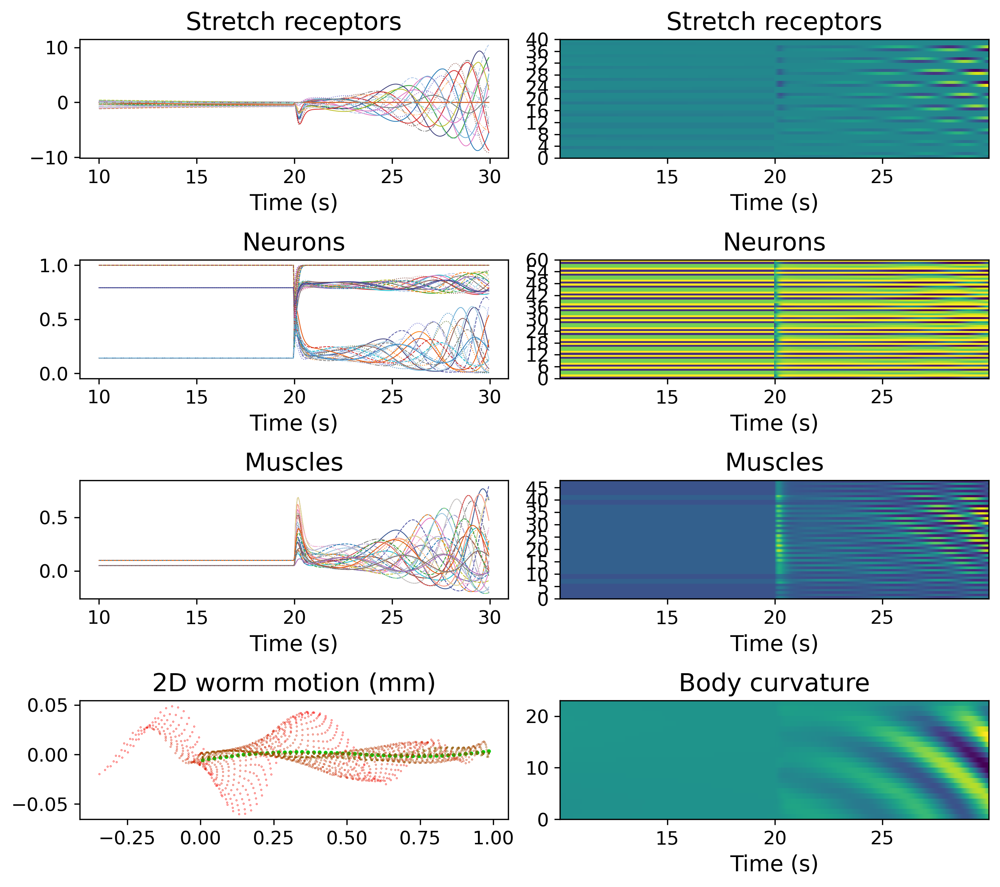

In [6]:
print('Further generations to be added: ' + str(args['maxGens']))
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

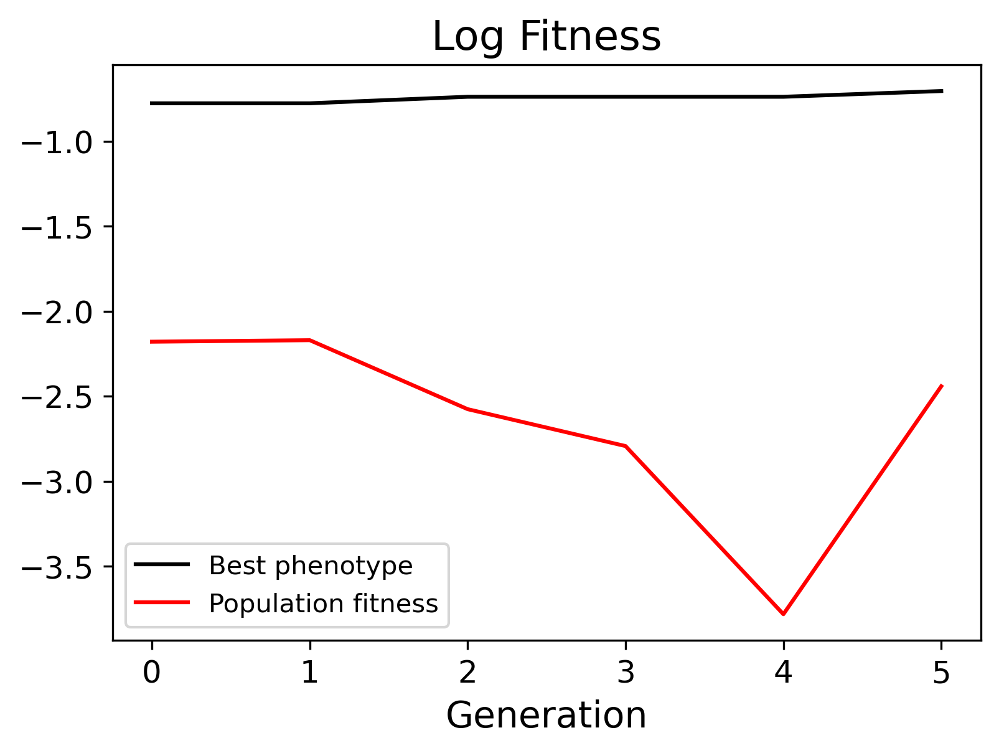

In [7]:
Image(filename=outputFolderName + '/EvoHist_fitness.png')

Run the evolution for further generations. This can be done multiple times, each time starting from the previous checkpoint. Each time the figures will need to be reloaded in the W2DPlots jupyter notebook. Some results, such as 'fitness.dat' are dynamically updated and can be examined during the progress of a long evolution by loading the the appropriate W2DPlots cell. If the 'evoAvLen' parameter is set, a moving averaged of the parameter values will be performed before plotting. However this will only take effect once another simulation has been performed. 

Further generations to be added: 20
Directory 'notebooks/example_W2DCEL' already exists and all the contents will be overwritten.
Parameter sr_type not found in worm_data.json
Parameter ab_output_level not found in worm_data.json
Parameter random_initial_state not found in worm_data.json
Parameter do_orig_musc_input not found in worm_data.json
Parameter do_orig_sr_input not found in worm_data.json

  Running Worm2D v0.1.0 with the following command:
['Worm2D/main_osc', '--do_reverse', '2', '--sr_type', 'None', '--ab_output_level', '1', '--random_initial_state', '1', '--avg_speed', '0.0001', '--fit_type', '0', '--do_orig_musc_input', '0', '--do_orig_sr_input', '0', '--do_test_run', '0', '--doForwardFirst', '0', '--sr_zero_gains_type', '1', '--do_legacy', '0', '-R', '4542', '--population_size', '16', '--duration', '24', '--transient', '8', '--max_generations', '20', '-sd', '10', '-st', '10', '--doevol', '1', '--checkpoint_interval', '5', '--folder', 'notebooks/example_W2DCEL', '--modelna

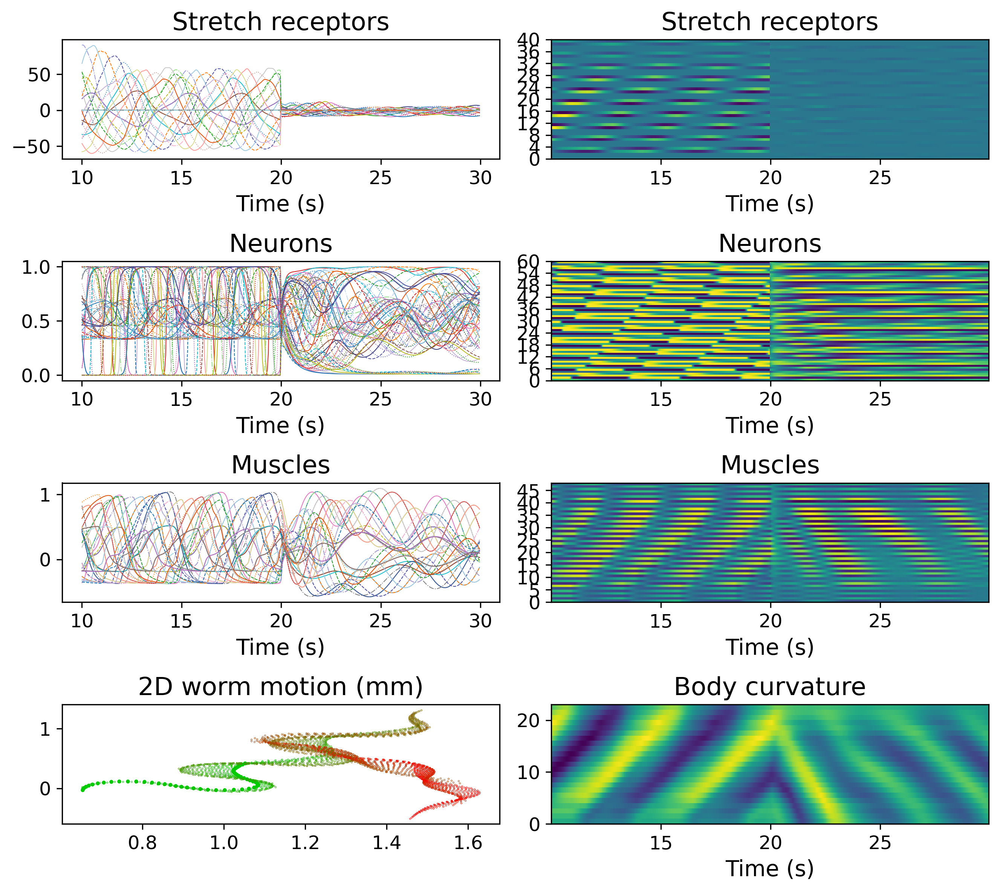

In [8]:
args['maxGens']=20 #run the optimization for more generations
args['evoAvLen']=10 #plot moving average of evolution history figures  
print('Further generations to be added: ' + str(args['maxGens']))
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

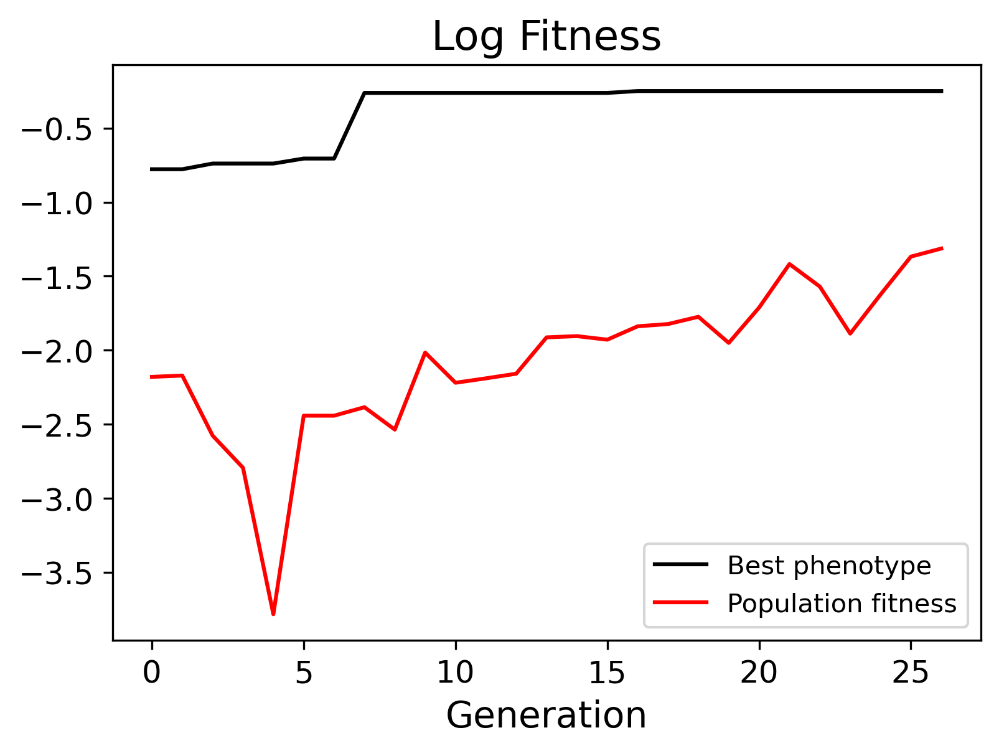

In [9]:
Image(filename=outputFolderName + '/EvoHist_fitness.png')

Further generations to be added: 20
Directory 'notebooks/example_W2DCEL' already exists and all the contents will be overwritten.
Parameter sr_type not found in worm_data.json
Parameter ab_output_level not found in worm_data.json
Parameter random_initial_state not found in worm_data.json
Parameter do_orig_musc_input not found in worm_data.json
Parameter do_orig_sr_input not found in worm_data.json

  Running Worm2D v0.1.0 with the following command:
['Worm2D/main_osc', '--do_reverse', '2', '--sr_type', 'None', '--ab_output_level', '1', '--random_initial_state', '1', '--avg_speed', '0.0001', '--fit_type', '0', '--do_orig_musc_input', '0', '--do_orig_sr_input', '0', '--do_test_run', '0', '--doForwardFirst', '0', '--sr_zero_gains_type', '1', '--do_legacy', '0', '-R', '4542', '--population_size', '16', '--duration', '24', '--transient', '8', '--max_generations', '20', '-sd', '10', '-st', '10', '--doevol', '1', '--checkpoint_interval', '5', '--folder', 'notebooks/example_W2DCEL', '--modelna

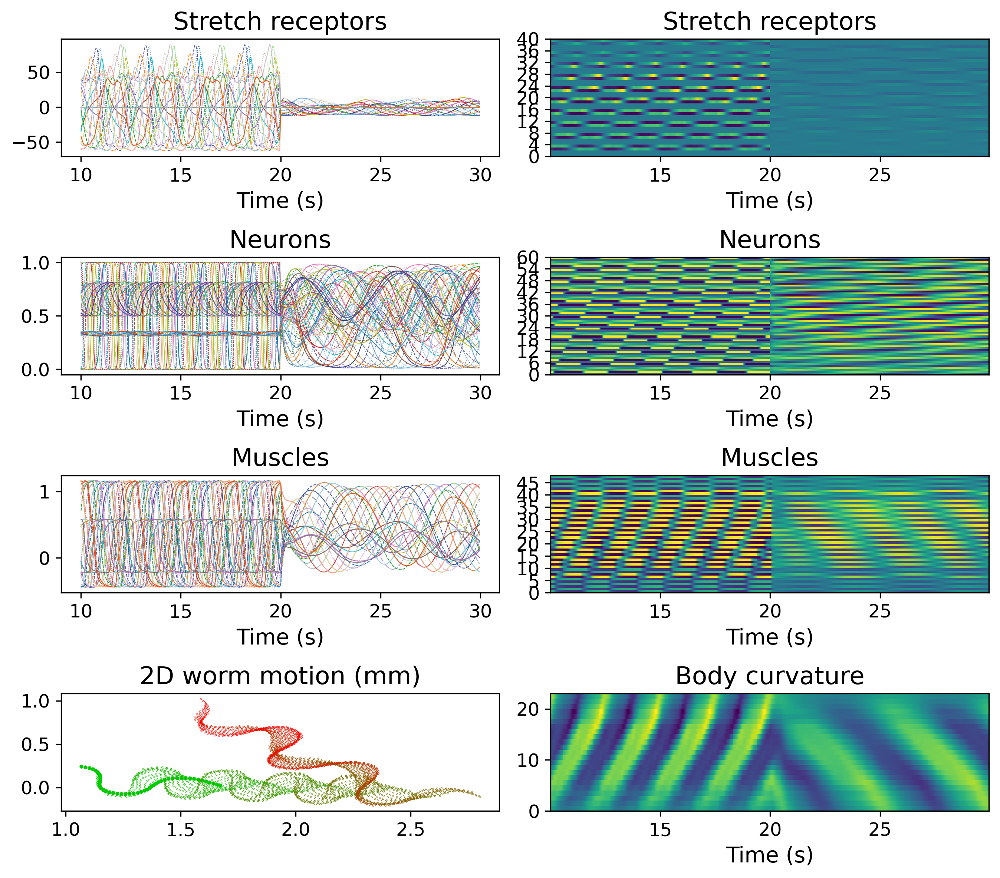

In [12]:
args['maxGens']=20 #run the optimization for more generations
print('Further generations to be added: ' + str(args['maxGens']))
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

In [13]:
with open(outputFolderName + '/fitness.dat') as f:
    print(f.read())

0.0 0.4594107172 0.1130986729 0.0305100115
1.0 0.4594107172 0.1141087343 0.03112245734
2.0 0.4773750009 0.07606251415 0.02482686069
3.0 0.4773750009 0.06123075681 0.01779967797
4.0 0.4773750009 0.02278202131 0.005128213809
5.0 0.4937443235 0.08702243846 0.02450503867
6.0 0.4937443235 0.08702243846 0.02450503867
7.0 0.7691013027 0.09215380999 0.04830609513
8.0 0.7691013027 0.07922124082 0.02227760579
9.0 0.7691013027 0.1332328985 0.04700280947
10.0 0.7691013027 0.1086930065 0.0285404855
11.0 0.7691013027 0.1119655694 0.02990807302
12.0 0.7691013027 0.1155464304 0.0288768798
13.0 0.7691013027 0.1476872001 0.03433405237
14.0 0.7691013027 0.1488944341 0.0340182871
15.0 0.7691013027 0.1453792734 0.03196776962
16.0 0.7788372053 0.1591185154 0.05550735138
17.0 0.7788372053 0.1615434349 0.0366415867
18.0 0.7788372053 0.1696814088 0.03566318166
19.0 0.7788372053 0.1422398036 0.03169931871
20.0 0.7788372053 0.1805777991 0.03866958411
21.0 0.7788372053 0.2422208939 0.04040103375
22.0 0.7788372053

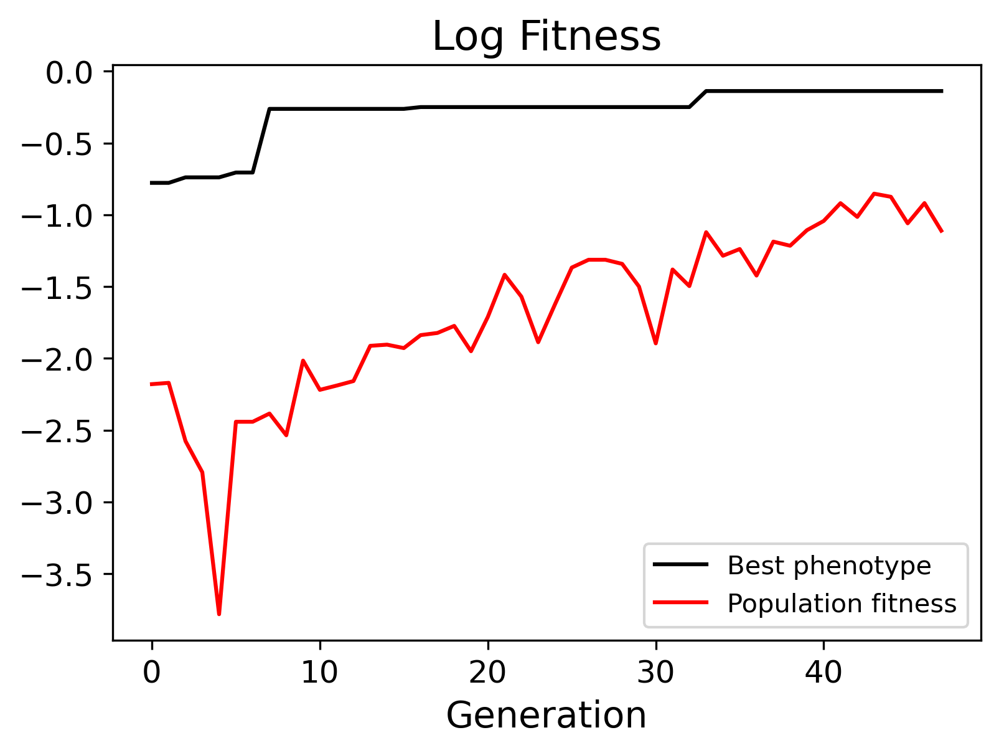

In [14]:
Image(filename=outputFolderName + '/EvoHist_fitness.png')

Further generations to be added: 20
Directory 'notebooks/example_W2DCEL' already exists and all the contents will be overwritten.
Parameter sr_type not found in worm_data.json
Parameter ab_output_level not found in worm_data.json
Parameter random_initial_state not found in worm_data.json
Parameter do_orig_musc_input not found in worm_data.json
Parameter do_orig_sr_input not found in worm_data.json

  Running Worm2D v0.1.0 with the following command:
['Worm2D/main_osc', '--do_reverse', '2', '--sr_type', 'None', '--ab_output_level', '1', '--random_initial_state', '1', '--avg_speed', '0.0001', '--fit_type', '0', '--do_orig_musc_input', '0', '--do_orig_sr_input', '0', '--do_test_run', '0', '--doForwardFirst', '0', '--sr_zero_gains_type', '1', '--do_legacy', '0', '-R', '4542', '--population_size', '16', '--duration', '24', '--transient', '8', '--max_generations', '20', '-sd', '10', '-st', '10', '--doevol', '1', '--checkpoint_interval', '5', '--folder', 'notebooks/example_W2DCEL', '--modelna

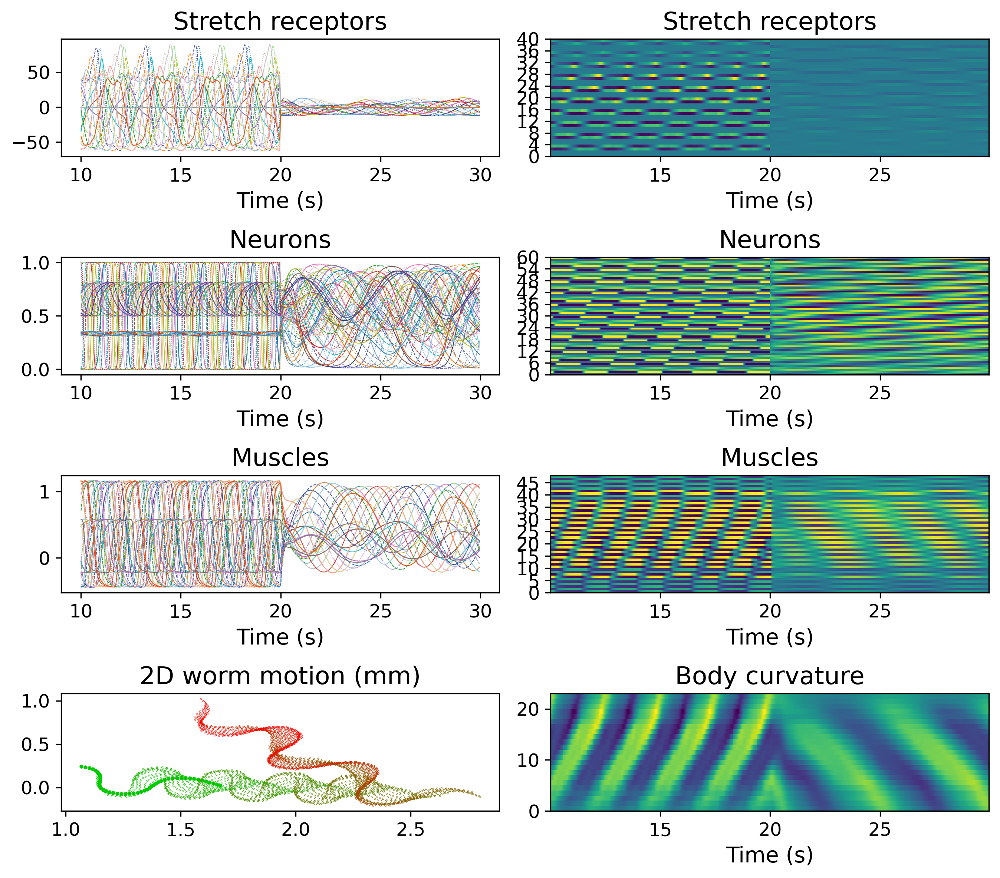

In [15]:
args['maxGens']=20 #run the optimization for more generations
print('Further generations to be added: ' + str(args['maxGens']))
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

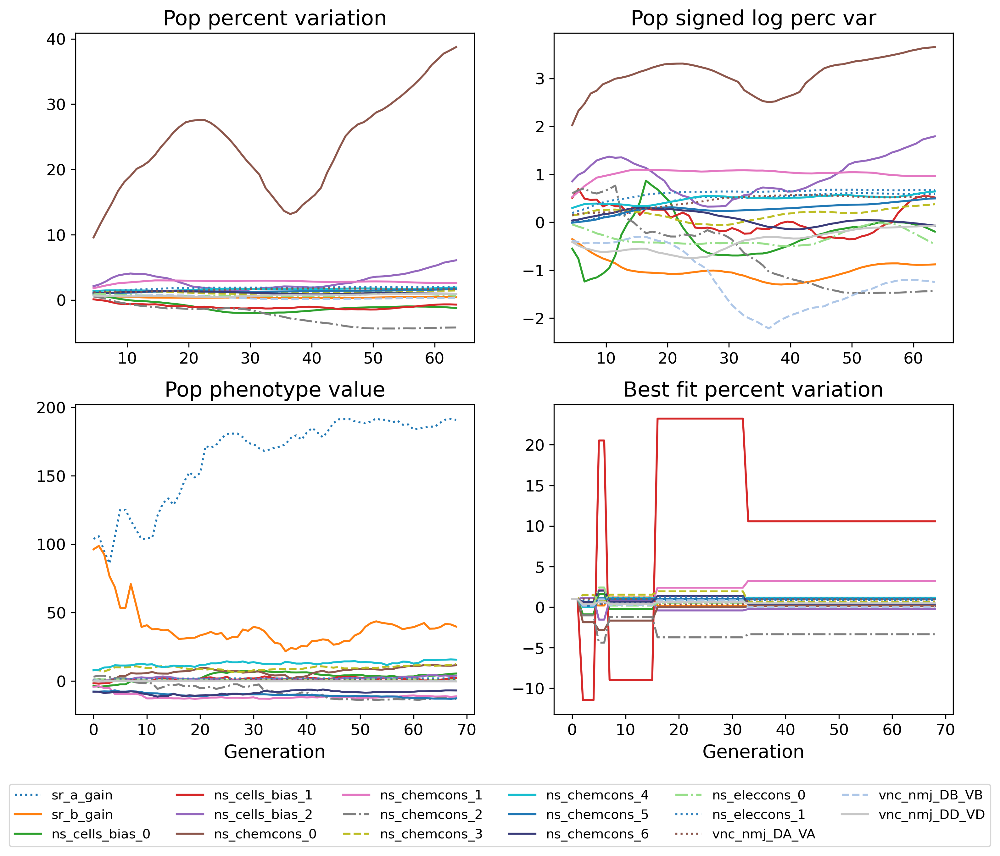

In [16]:
Image(filename=outputFolderName + '/EvoHist.png')

Find out what the strongest varying parameters are:

In [11]:
json_data = hf.get_worm_json(outputFolderName)
matches = hf.find_evotag_objects(json_data, "ns_chemcons_0")
print(json.dumps(matches, indent=2))

{
  "nervous_system": {
    "chemical_conns": {
      "value": [
        {
          "from": "DA_0",
          "to": "DA_0",
          "weight": {
            "evotag": "ns_chemcons_0",
            "value": 0.03841936350586786
          }
        },
        {
          "from": "VA_0",
          "to": "VA_0",
          "weight": {
            "evotag": "ns_chemcons_0",
            "value": 0.03841936350586786
          }
        },
        {
          "from": "DA_1",
          "to": "DA_1",
          "weight": {
            "evotag": "ns_chemcons_0",
            "value": 0.03841936350586786
          }
        },
        {
          "from": "VA_1",
          "to": "VA_1",
          "weight": {
            "evotag": "ns_chemcons_0",
            "value": 0.03841936350586786
          }
        },
        {
          "from": "DA_2",
          "to": "DA_2",
          "weight": {
            "evotag": "ns_chemcons_0",
            "value": 0.03841936350586786
          }
        },
        {


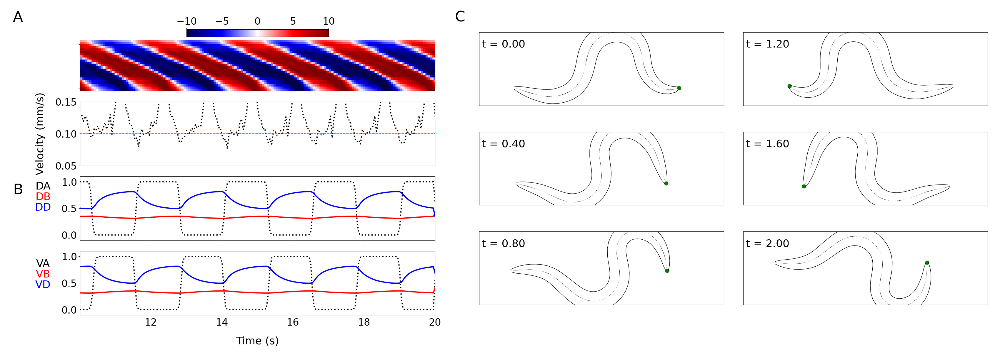

In [17]:
Image(filename=outputFolderName + '/behavior.png')

Run a longer simulation with different parameters:

Further generations to be added: 20
Directory 'notebooks/example_W2DCEL' already exists and the simulation results will be overwritten.
Parameter sr_type not found in worm_data.json
Parameter ab_output_level not found in worm_data.json
Parameter random_initial_state not found in worm_data.json
Parameter do_orig_musc_input not found in worm_data.json
Parameter do_orig_sr_input not found in worm_data.json

  Running Worm2D v0.1.0 with the following command:
['Worm2D/main_osc', '--do_reverse', '2', '--sr_type', 'None', '--ab_output_level', '5', '--random_initial_state', '1', '--avg_speed', '0.0001', '--fit_type', '0', '--do_orig_musc_input', '0', '--do_orig_sr_input', '0', '--do_test_run', '0', '--doForwardFirst', '1', '--sr_zero_gains_type', '1', '--do_legacy', '0', '-R', '4542', '--population_size', '16', '--duration', '24', '--transient', '8', '--max_generations', '20', '-sd', '30', '-st', '10', '--doevol', '0', '--checkpoint_interval', '5', '--folder', 'notebooks/example_W2DCEL', '--m

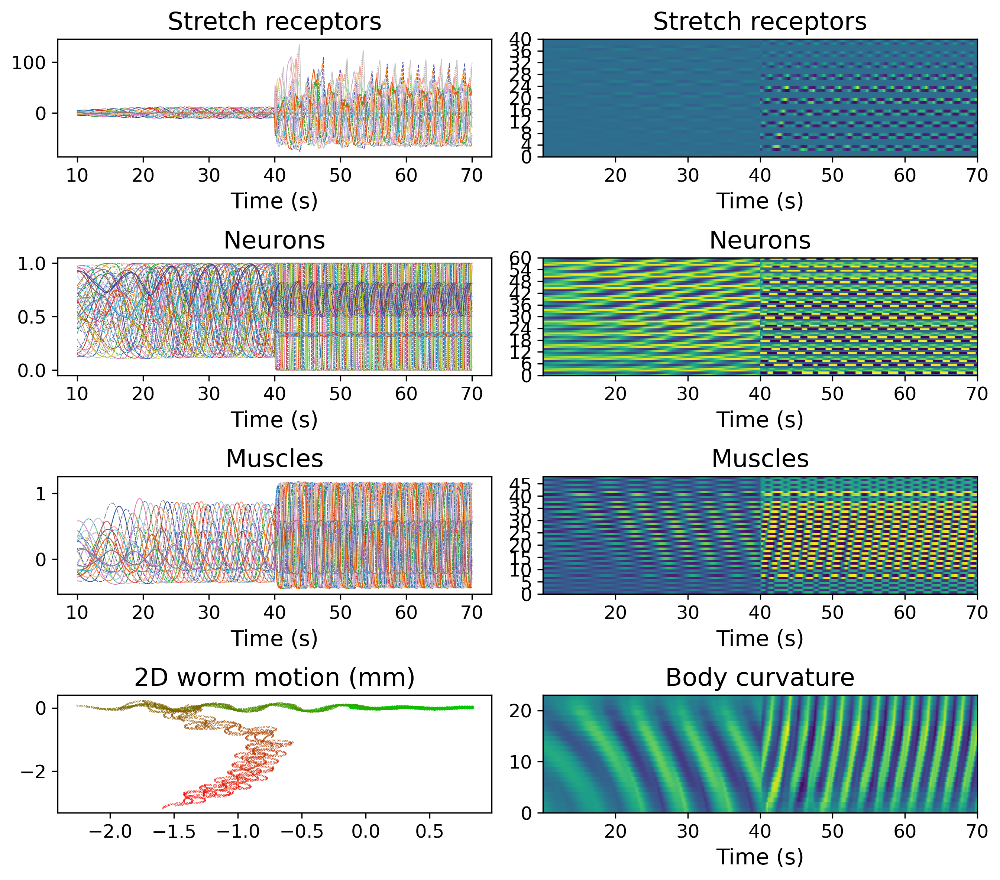

In [18]:
args['simduration']= 30
args['doEvol'] = False  # Run evolutionary optimization before the final simulation.
#args['SRType'] = "SR_TRANS_CONTRACT"  # Retain only contraction-related stretch-receptor signals.
#args['SRType'] = "SR_TRANS_STRETCH"
args['SRType'] = "None" 
args['ABLevel'] = 5  # Set the directional input strength supplied to A- or B-class motor neurons.
args['doForwardFirst'] = True  # Run the backward final simulation before the forward simulation.
args['SRZeroGainsType'] = 1  # Disable feedback to the motor-neuron class inactive for the direction.
print('Further generations to be added: ' + str(args['maxGens']))
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

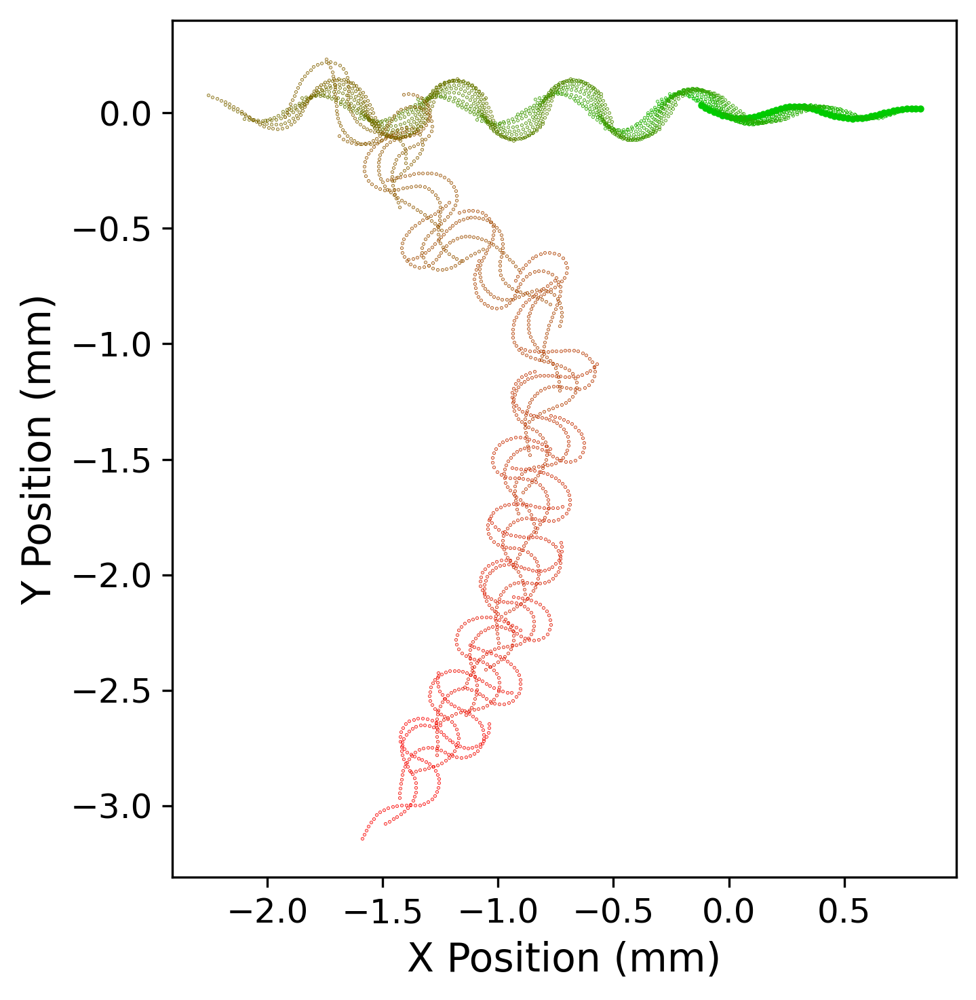

In [19]:
Image(filename=outputFolderName + '/Motion.png')